Kian Anvari

Filtering in spatial domain

Computer Vision

# RGB image

In [1]:
import cv2
import numpy as np
import urllib.request
import matplotlib.pyplot as plt

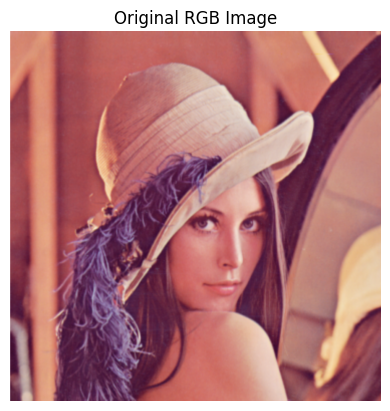

In [2]:
# Load the image using OpenCV
image = cv2.imread('Lenna_RGB.png')

# Convert the image from BGR (OpenCV default) to RGB for display purposes
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Display the original RGB image
plt.imshow(image_rgb)
plt.axis('off')
plt.title('Original RGB Image')
plt.show()


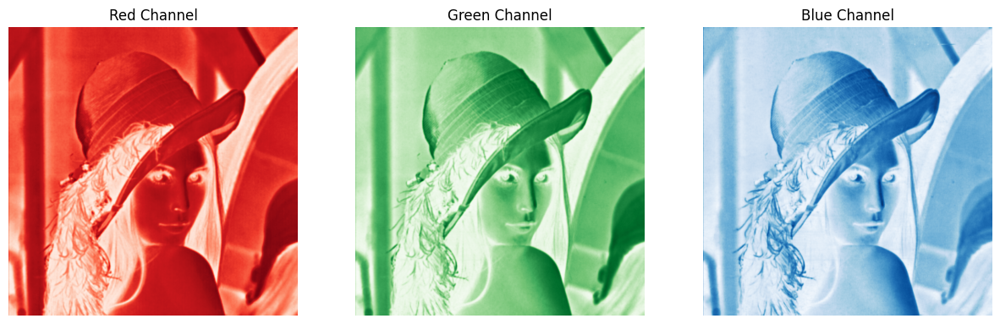

In [3]:
# Split the image into its 3 color channels
B, G, R = cv2.split(image)

# Display the channels using a simpler approach
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# Red channel
axs[0].imshow(R, cmap='Reds')
axs[0].set_title('Red Channel')
axs[0].axis('off')

# Green channel
axs[1].imshow(G, cmap='Greens')
axs[1].set_title('Green Channel')
axs[1].axis('off')

# Blue channel
axs[2].imshow(B, cmap='Blues')
axs[2].set_title('Blue Channel')
axs[2].axis('off')

plt.show()

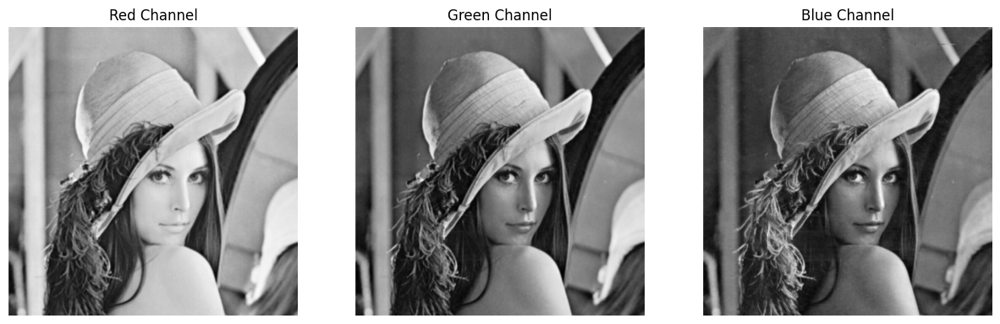

In [5]:
# Split the image into its 3 color channels
B, G, R = cv2.split(image)

# Display the channels using a simpler approach
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# Red channel
axs[0].imshow(R, cmap='gray')
axs[0].set_title('Red Channel')
axs[0].axis('off')

# Green channel
axs[1].imshow(G, cmap='gray')
axs[1].set_title('Green Channel')
axs[1].axis('off')

# Blue channel
axs[2].imshow(B, cmap='gray')
axs[2].set_title('Blue Channel')
axs[2].axis('off')

plt.show()

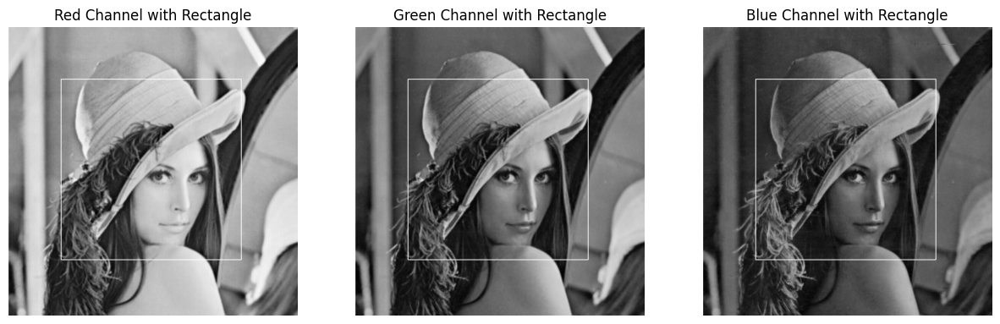

In [30]:
# Calculate the center of the image and set rectangle dimensions
height, width = image.shape[:2]
center_x, center_y = width // 2, height // 2
rect_width, rect_height = 700, 700  # Width and height of the rectangle

# Top-left and bottom-right coordinates of the rectangle
top_left = (center_x - rect_width // 2, center_y - rect_height // 2)
bottom_right = (center_x + rect_width // 2, center_y + rect_height // 2)

# Create copies of the channels to draw the rectangles on them
B_rect = B.copy()
G_rect = G.copy()
R_rect = R.copy()

# Draw rectangles on each channel
cv2.rectangle(B_rect, top_left, bottom_right, (255, 255, 255), 2)  # White rectangle
cv2.rectangle(G_rect, top_left, bottom_right, (255, 255, 255), 2)  # White rectangle
cv2.rectangle(R_rect, top_left, bottom_right, (255, 255, 255), 2)  # White rectangle

# Display the channels with rectangles
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# Red channel
axs[0].imshow(R_rect, cmap='gray')
axs[0].set_title('Red Channel with Rectangle')
axs[0].axis('off')

# Green channel
axs[1].imshow(G_rect, cmap='gray')
axs[1].set_title('Green Channel with Rectangle')
axs[1].axis('off')

# Blue channel
axs[2].imshow(B_rect, cmap='gray')
axs[2].set_title('Blue Channel with Rectangle')
axs[2].axis('off')

plt.show()

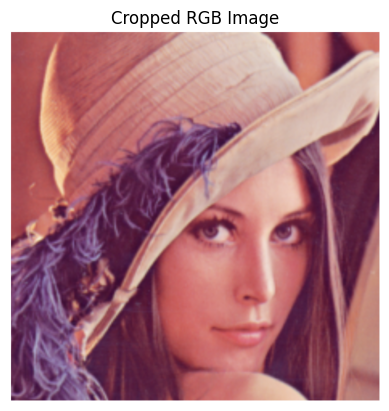

In [31]:
# Step 1: Crop the rectangle from each channel
B_crop = B_rect[top_left[1]:bottom_right[1], top_left[0]:bottom_right[0]]
G_crop = G_rect[top_left[1]:bottom_right[1], top_left[0]:bottom_right[0]]
R_crop = R_rect[top_left[1]:bottom_right[1], top_left[0]:bottom_right[0]]

# Step 2: Merge the cropped channels to create an RGB image
cropped_bgr_image = cv2.merge([B_crop, G_crop, R_crop])

image_rgb = cv2.cvtColor(cropped_bgr_image, cv2.COLOR_BGR2RGB)

# Step 3: Display the cropped RGB image
plt.imshow(image_rgb)
plt.title('Cropped RGB Image')
plt.axis('off')
plt.show()


# Point Procssing

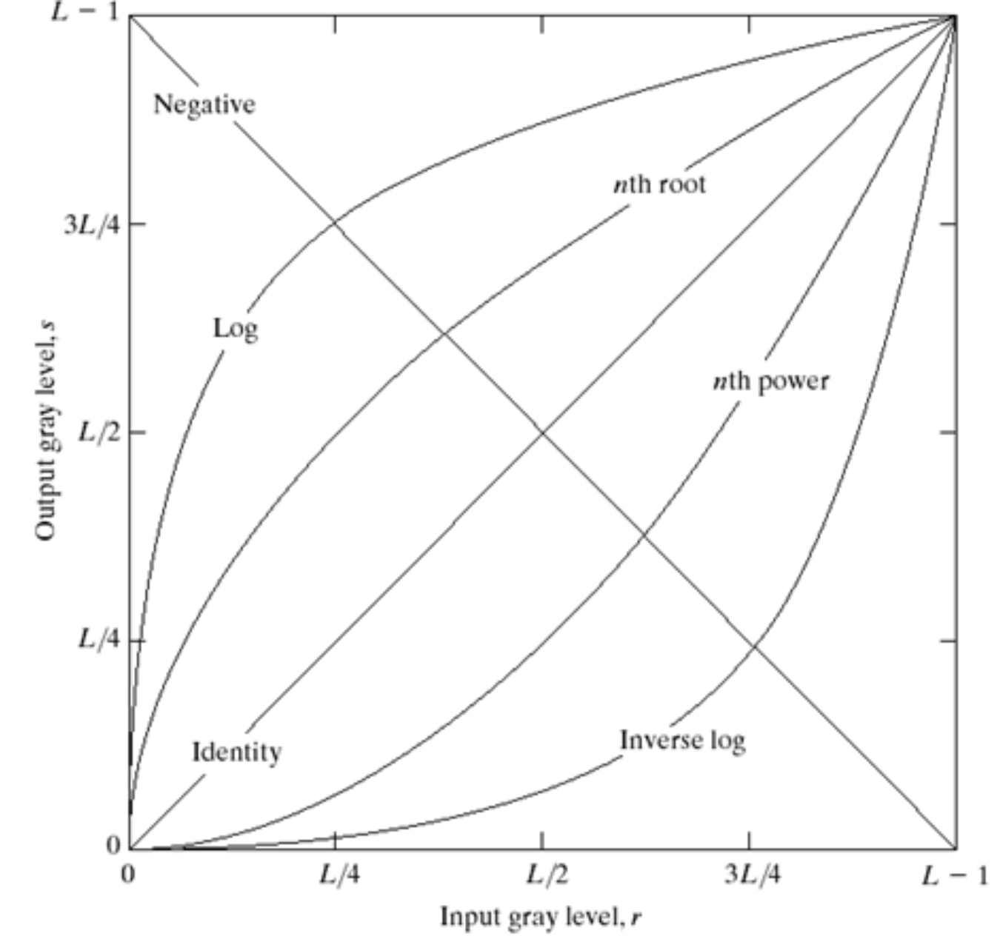

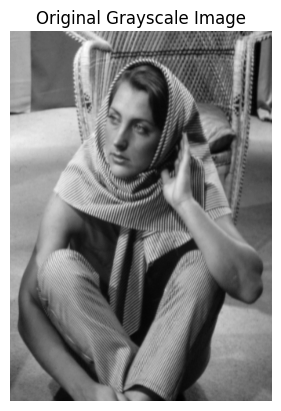

In [41]:
# Load the grayscale image
image_gray = cv2.imread('Barbara_GRAY.png', cv2.IMREAD_GRAYSCALE)

# Display the grayscale image
plt.imshow(image_gray, cmap='gray')
plt.title('Original Grayscale Image')
plt.axis('off')
plt.show()

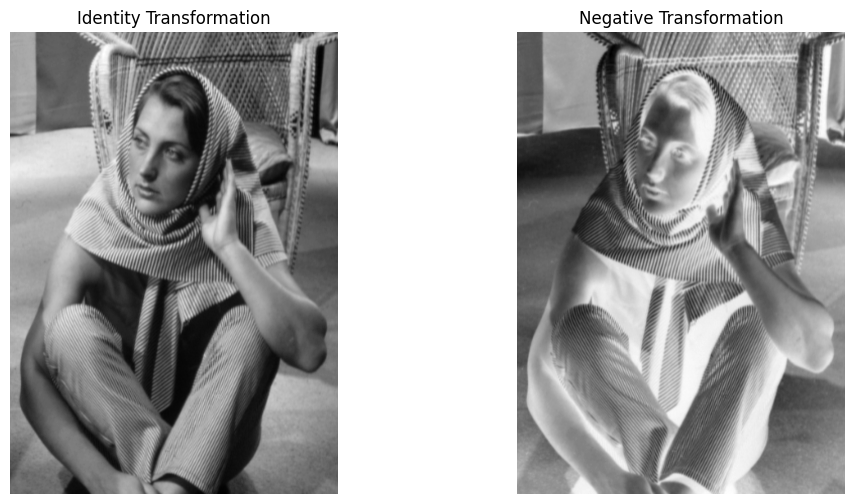

In [40]:
# Linear Transformation - Identity (No Change)
identity_image = image_gray.copy()

# it is proper for enhancing white and gray detail embedded in dark regions of images,
# Linear Transformation - Negative (255 - pixel_value)
negative_image = cv2.bitwise_not(image_gray)

# Display the images
fig, axs = plt.subplots(1, 2, figsize=(12, 6))

axs[0].imshow(identity_image, cmap='gray')
axs[0].set_title('Identity Transformation')
axs[0].axis('off')

axs[1].imshow(negative_image, cmap='gray')
axs[1].set_title('Negative Transformation')
axs[1].axis('off')

plt.show()

# Linear Transformations:

# Identity: This keeps the image unchanged.
# Negative: Inverts the image by subtracting each pixel value from 255.

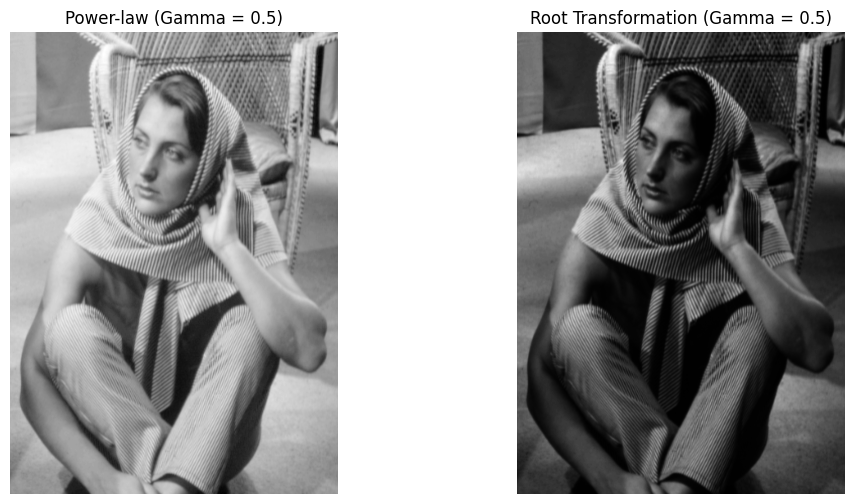

In [43]:
# Power-law (Gamma) transformation
gamma = 0.5  # Try different gamma values here
power_law_image = np.array(255 * (image_gray / 255) ** gamma, dtype='uint8')

# Root transformation (Gamma > 1)
gamma_root = 0.5  # You can change this value as needed
root_image = np.array(255 * (image_gray / 255) ** (1 / gamma_root), dtype='uint8')

# Display the power-law and root images
fig, axs = plt.subplots(1, 2, figsize=(12, 6))

axs[0].imshow(power_law_image, cmap='gray')
axs[0].set_title(f'Power-law (Gamma = {gamma})')
axs[0].axis('off')

axs[1].imshow(root_image, cmap='gray')
axs[1].set_title(f'Root Transformation (Gamma = {gamma_root})')
axs[1].axis('off')

plt.show()


# Power-Law (Gamma Correction):

# Power (Gamma < 1): This increases the contrast of dark regions and is often used for gamma correction.
# Root (Gamma > 1): This decreases contrast in bright regions, useful for bringing out details in high-intensity areas.

<!-- Point Processing

Multiple threshold -->


# Multiple thresholding

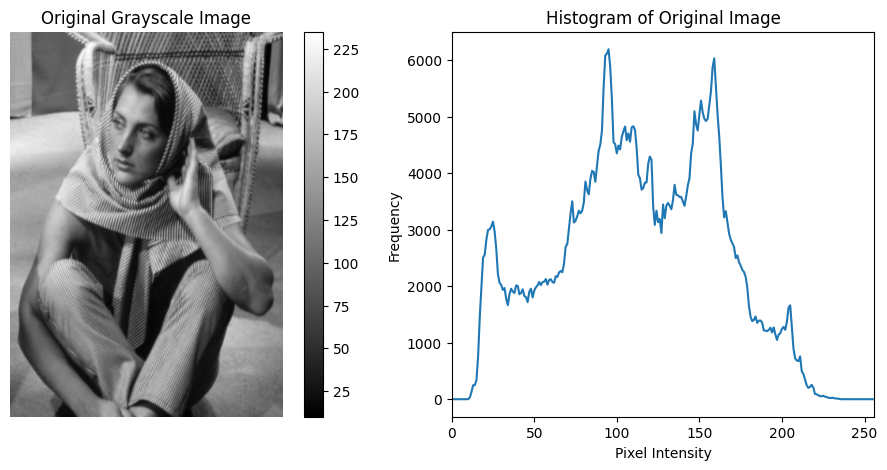

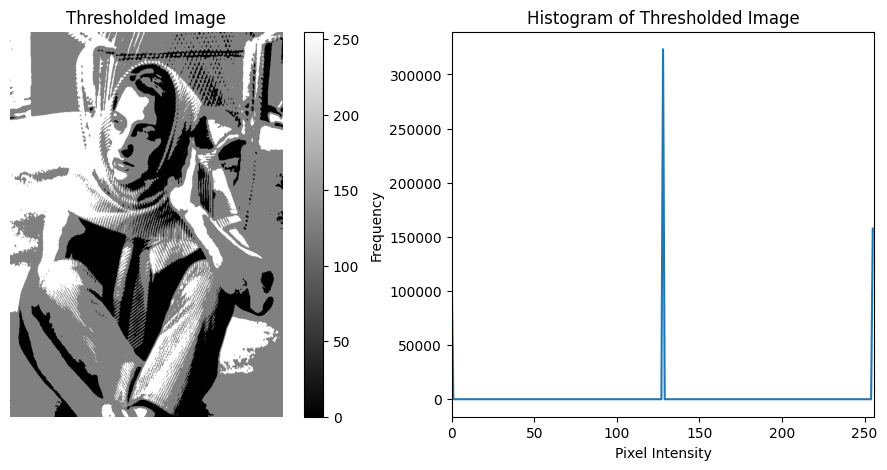

In [44]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import urllib.request

# Load the grayscale image
image_gray = cv2.imread('Barbara_GRAY.png', cv2.IMREAD_GRAYSCALE)

# Step 3: Show the original image and its histogram
def plot_histogram(image, title):
    hist = cv2.calcHist([image], [0], None, [256], [0, 256])
    plt.plot(hist)
    plt.xlim([0, 256])
    plt.title(title)
    plt.xlabel('Pixel Intensity')
    plt.ylabel('Frequency')

# Display the original image and histogram
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(image_gray, cmap='gray')
plt.title('Original Grayscale Image')
plt.colorbar()
plt.axis('off')

plt.subplot(1, 2, 2)
plot_histogram(image_gray, 'Histogram of Original Image')
plt.show()

# Step 4: Apply Multiple Thresholding (Slicing)
# Define thresholds
thresh1 = 70
thresh2 = 150

# Create a new image for the output
thresholded_image = np.zeros_like(image_gray)

# Apply the thresholds (slicing)
thresholded_image[(image_gray >= thresh1) & (image_gray < thresh2)] = 128  # Mid gray for in-between
thresholded_image[image_gray >= thresh2] = 255  # White for above second threshold

# Step 5: Show the thresholded image and its histogram
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(thresholded_image, cmap='gray')
plt.colorbar()
plt.title('Thresholded Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plot_histogram(thresholded_image, 'Histogram of Thresholded Image')
plt.show()

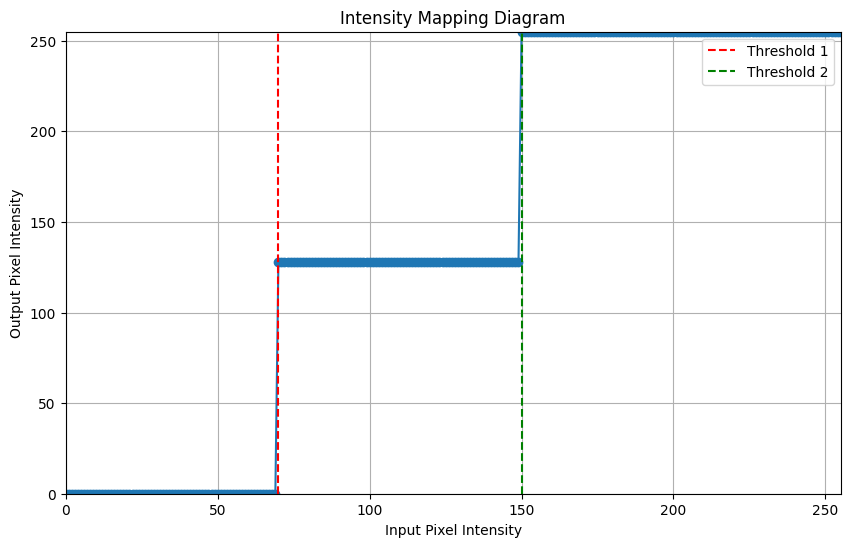

In [45]:
# Threshold mapping
input_intensities = np.arange(256)
output_intensities = np.zeros_like(input_intensities)

# Mapping based on thresholds
for i in range(len(input_intensities)):
    if input_intensities[i] < thresh1:
        output_intensities[i] = 0  # Below the first threshold
    elif thresh1 <= input_intensities[i] < thresh2:
        output_intensities[i] = 128  # Mid gray for in-between
    else:
        output_intensities[i] = 255  # Above the second threshold

# Plot the mapping diagram
plt.figure(figsize=(10, 6))
plt.plot(input_intensities, output_intensities, marker='o')
plt.title('Intensity Mapping Diagram')
plt.xlabel('Input Pixel Intensity')
plt.ylabel('Output Pixel Intensity')
plt.xlim(0, 255)
plt.ylim(0, 255)
plt.grid()
plt.axvline(x=thresh1, color='r', linestyle='--', label='Threshold 1')
plt.axvline(x=thresh2, color='g', linestyle='--', label='Threshold 2')
plt.legend()
plt.show()

<!-- POINT PROCESSING

Multiple thresholding  -->

# Histogram equalization

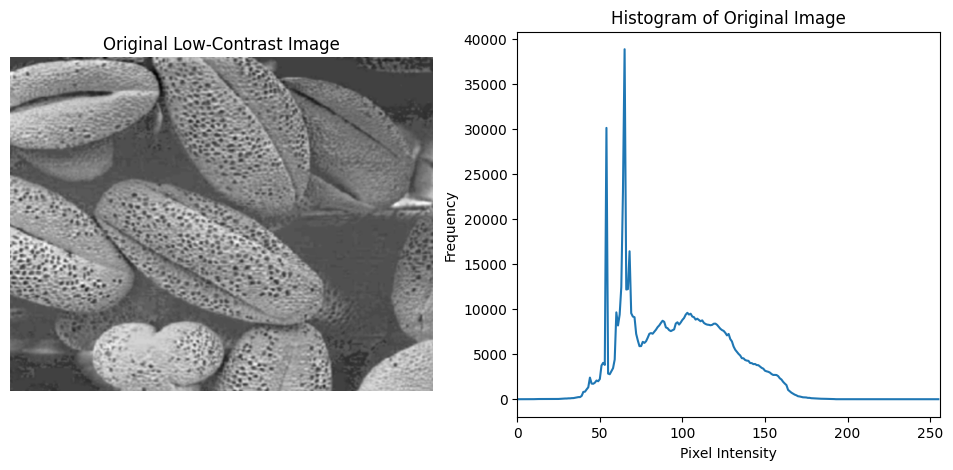

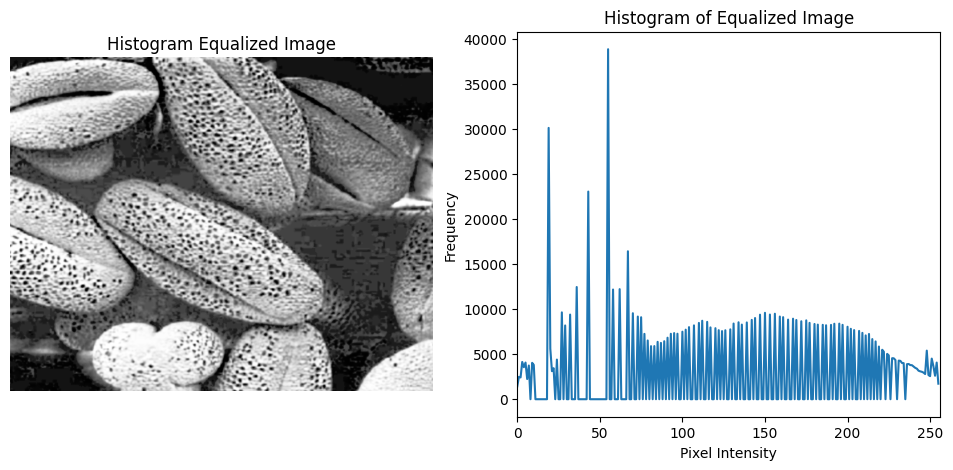

In [46]:
# Read the image in grayscale
low_contrast_image = cv2.imread('Coffee_GRAY.png', cv2.IMREAD_GRAYSCALE)

# Step 3: Show the original low-contrast image and its histogram
def plot_histogram(image, title):
    hist = cv2.calcHist([image], [0], None, [256], [0, 256])
    plt.plot(hist)
    plt.xlim([0, 256])
    plt.title(title)
    plt.xlabel('Pixel Intensity')
    plt.ylabel('Frequency')

# Display the original image and histogram
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(low_contrast_image, cmap='gray')
plt.title('Original Low-Contrast Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plot_histogram(low_contrast_image, 'Histogram of Original Image')
plt.show()

# Step 4: Apply Histogram Equalization
equalized_image = cv2.equalizeHist(low_contrast_image)

# Step 5: Show the equalized image and its histogram
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(equalized_image, cmap='gray')
plt.title('Histogram Equalized Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plot_histogram(equalized_image, 'Histogram of Equalized Image')
plt.show()

# AND , OR , and NOT are functionally complete logical operators

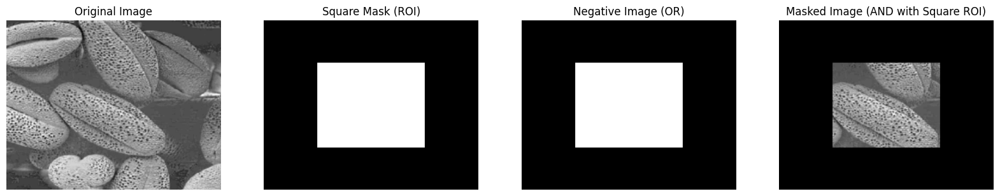

In [47]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load a grayscale image
image = cv2.imread('Coffee_GRAY.png', cv2.IMREAD_GRAYSCALE)

# Display the original image
plt.figure(figsize=(20, 10))
plt.subplot(1, 4, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

# Part 1: Create and Display the Mask (Square ROI)
# Create a square mask
mask = np.zeros(image.shape, dtype="uint8")
start_x = image.shape[1] // 4
start_y = image.shape[0] // 4
end_x = start_x + image.shape[1] // 2
end_y = start_y + image.shape[0] // 2

cv2.rectangle(mask, (start_x, start_y), (end_x, end_y), 255, -1)  # -1 means filled rectangle

# Display the mask
plt.subplot(1, 4, 2)
plt.imshow(mask, cmap='gray')
plt.title('Square Mask (ROI)')
plt.axis('off')

# Part 3: AND (Masking an ROI)
# Apply AND operation with the mask to isolate the square ROI
masked_image = cv2.bitwise_and(image, mask)

# Part 4: OR (Enhancing the ROI)
# Add brightness to the square ROI
brightened_image = cv2.bitwise_or(masked_image, mask)

# Display Negative (NOT) Image
plt.subplot(1, 4, 3)
plt.imshow(brightened_image, cmap='gray')
plt.title('Negative Image (OR)')
plt.axis('off')

# Display the masked image (ROI)
plt.subplot(1, 4, 4)
plt.imshow(masked_image, cmap='gray')
plt.title('Masked Image (AND with Square ROI)')
plt.axis('off')

plt.show()

# BIT PLANE

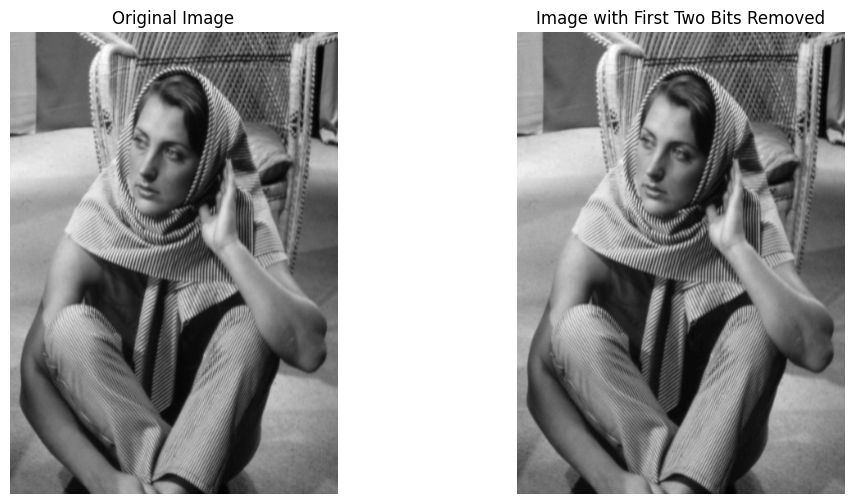

In [48]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load a grayscale image
image = cv2.imread('Barbara_GRAY.png', cv2.IMREAD_GRAYSCALE)

# Display the original image
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

# Bit-plane slicing: Removing the first two bits
# Set the first two bits to 0
# This can be done using a bitwise AND with a mask that clears the first two bits
bit_mask = 0b11111100  # This keeps the top 6 bits and sets the two least significant bits (LSBs) to 0
compressed_image = cv2.bitwise_and(image, bit_mask)

# Display the compressed image (first two bits removed)
plt.subplot(1, 2, 2)
plt.imshow(compressed_image, cmap='gray')
plt.title('Image with First Two Bits Removed')
plt.axis('off')

plt.show()


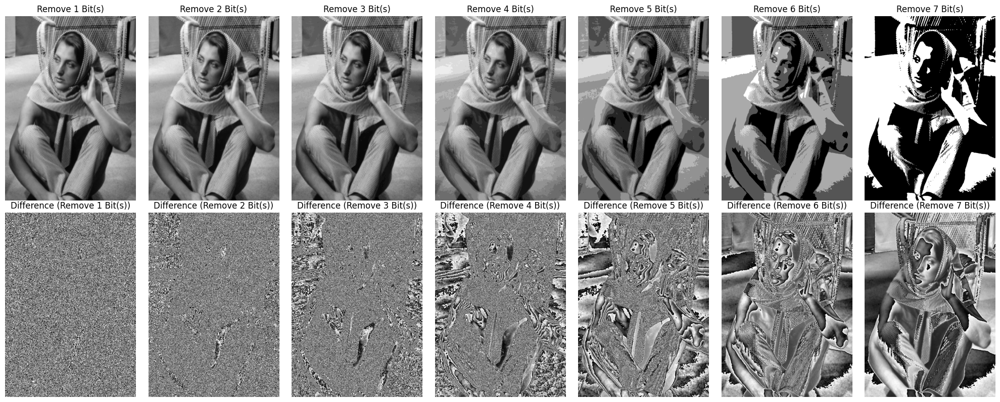

In [49]:
# Create a figure with two rows: one for the compressed images and one for the differences
fig, axs = plt.subplots(2, 7, figsize=(20, 8))

# Loop over the number of bits to remove
for i in range(1, 8):
    # Create the bit mask by keeping only the upper bits and zeroing out the lower bits
    bit_mask = 0xFF & (0xFF << i)  # Keeps the top (8 - i) bits and removes the lower bits

    # Apply the mask using bitwise AND operation
    compressed_image = cv2.bitwise_and(image, bit_mask)

    # Calculate the difference between the original and compressed images
    difference_image = cv2.absdiff(image, compressed_image)

    # Display the compressed image in the first row
    axs[0, i-1].imshow(compressed_image, cmap='gray')
    axs[0, i-1].set_title(f'Remove {i} Bit(s)')
    axs[0, i-1].axis('off')

    # Display the difference image in the second row
    axs[1, i-1].imshow(difference_image, cmap='gray')
    axs[1, i-1].set_title(f'Difference (Remove {i} Bit(s))')
    axs[1, i-1].axis('off')

# Display the figure
plt.tight_layout()
plt.show()


# FILTERTING

# Averaging Filter

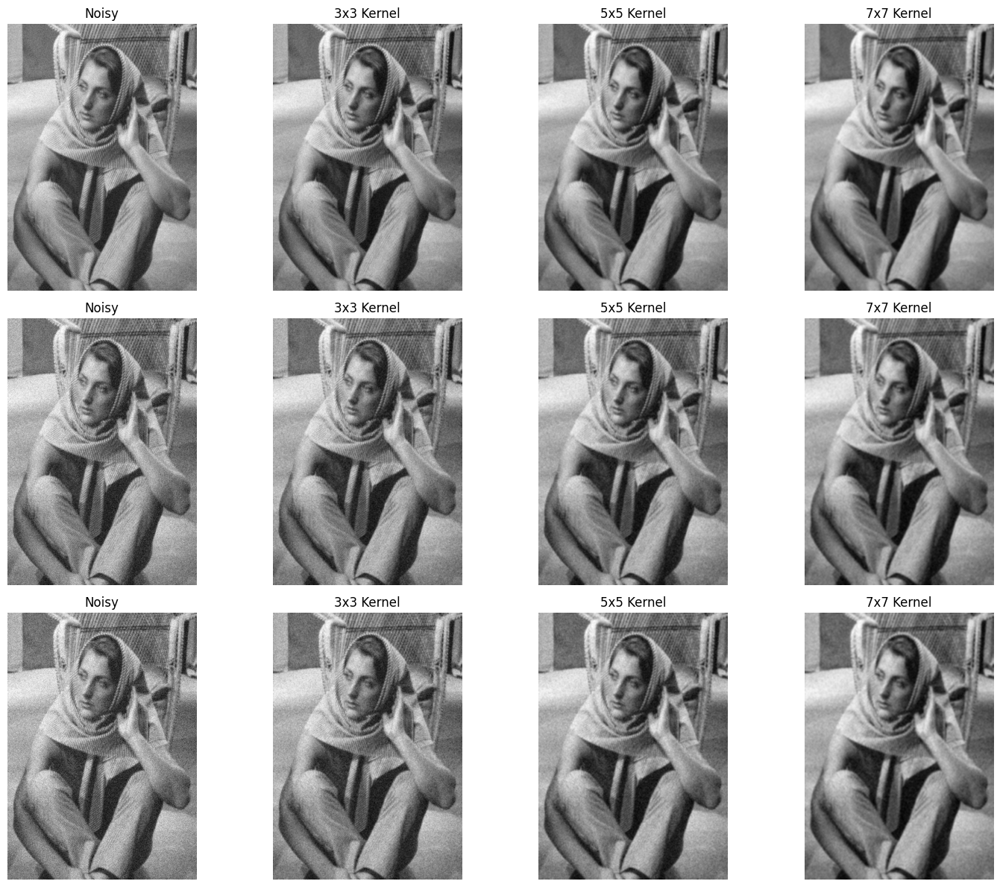

3x3 Kernel:
 [[0.11111111 0.11111111 0.11111111]
 [0.11111111 0.11111111 0.11111111]
 [0.11111111 0.11111111 0.11111111]]

5x5 Kernel:
 [[0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]]

7x7 Kernel:
 [[0.02040816 0.02040816 0.02040816 0.02040816 0.02040816 0.02040816
  0.02040816]
 [0.02040816 0.02040816 0.02040816 0.02040816 0.02040816 0.02040816
  0.02040816]
 [0.02040816 0.02040816 0.02040816 0.02040816 0.02040816 0.02040816
  0.02040816]
 [0.02040816 0.02040816 0.02040816 0.02040816 0.02040816 0.02040816
  0.02040816]
 [0.02040816 0.02040816 0.02040816 0.02040816 0.02040816 0.02040816
  0.02040816]
 [0.02040816 0.02040816 0.02040816 0.02040816 0.02040816 0.02040816
  0.02040816]
 [0.02040816 0.02040816 0.02040816 0.02040816 0.02040816 0.02040816
  0.02040816]]


In [50]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the grayscale image
image = cv2.imread('Barbara_GRAY.png', cv2.IMREAD_GRAYSCALE)


# Function to add Gaussian noise
def add_gaussian_noise(image, mean=20, var=10):
    sigma = var ** 0.5
    gauss = np.random.normal(mean, sigma, image.shape)
    noisy_image = np.clip(image + gauss, 0, 255).astype(np.uint8)
    return noisy_image

# Function to apply averaging filter
def apply_averaging_filter(image, kernel_size):
    return cv2.blur(image, (kernel_size, kernel_size))

# Noise levels (variance)
noise_levels = [300, 800, 1000]

# Averaging kernel sizes
kernel_sizes = [3, 5, 7]

# Create a figure for visualization (one row for each noise level, 4 columns)
fig, axs = plt.subplots(len(noise_levels), len(kernel_sizes) + 1, figsize=(15, 12))

# Loop over noise levels
for i, noise_var in enumerate(noise_levels):
    # Add noise to the image
    noisy_image = add_gaussian_noise(image, var=noise_var)

    # Display the noisy image in the first column of the row
    axs[i, 0].imshow(noisy_image, cmap='gray')
    axs[i, 0].set_title(f'Noisy')
    axs[i, 0].axis('off')

    # Apply different averaging filters to the noisy image
    for j, kernel_size in enumerate(kernel_sizes):
        filtered_image = apply_averaging_filter(noisy_image, kernel_size)

        # Display the filtered images
        axs[i, j+1].imshow(filtered_image, cmap='gray')
        axs[i, j+1].set_title(f'{kernel_size}x{kernel_size} Kernel')
        axs[i, j+1].axis('off')

# Display the figure
plt.tight_layout()
plt.show()

# Display the averaging kernels for reference
print("3x3 Kernel:\n", np.ones((3, 3), np.float32) / 9)
print("\n5x5 Kernel:\n", np.ones((5, 5), np.float32) / 25)
print("\n7x7 Kernel:\n", np.ones((7, 7), np.float32) / 49)


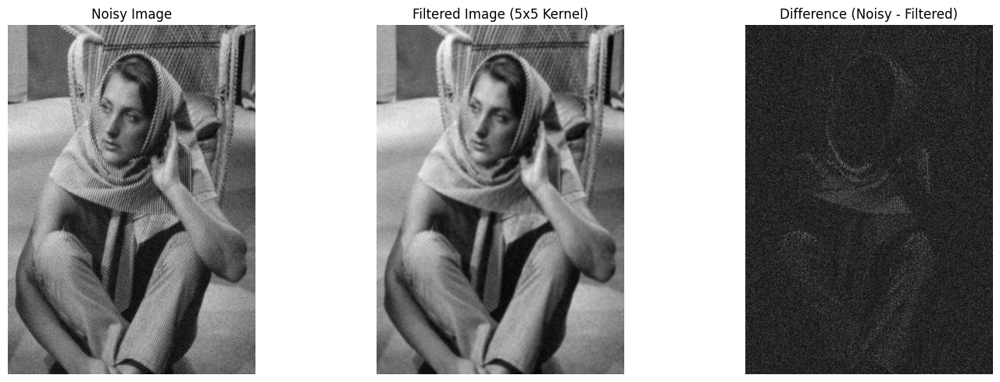

In [51]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the grayscale image
image = cv2.imread('Barbara_GRAY.png', cv2.IMREAD_GRAYSCALE)

# Function to add Gaussian noise
def add_gaussian_noise(image, mean=0, var=1000):
    sigma = var ** 0.5
    gauss = np.random.normal(mean, sigma, image.shape)
    noisy_image = np.clip(image + gauss, 0, 255).astype(np.uint8)
    return noisy_image

# Function to apply averaging filter
def apply_averaging_filter(image, kernel_size):
    return cv2.blur(image, (kernel_size, kernel_size))

# Add noise to the image (variance 30 for moderate noise)
noisy_image = add_gaussian_noise(image, var=300)

# Apply averaging filter (e.g., 5x5 kernel)
kernel_size = 5
filtered_image = apply_averaging_filter(noisy_image, kernel_size)

# Calculate the difference between the noisy image and filtered image
difference_image = cv2.absdiff(noisy_image, filtered_image)

# Plot the results
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# Display noisy image
axs[0].imshow(noisy_image, cmap='gray')
axs[0].set_title('Noisy Image')
axs[0].axis('off')

# Display filtered image
axs[1].imshow(filtered_image, cmap='gray')
axs[1].set_title(f'Filtered Image ({kernel_size}x{kernel_size} Kernel)')
axs[1].axis('off')

# Display the difference
axs[2].imshow(difference_image, cmap='gray')
axs[2].set_title(f'Difference (Noisy - Filtered)')
axs[2].axis('off')

plt.tight_layout()
plt.show()


# Median filters

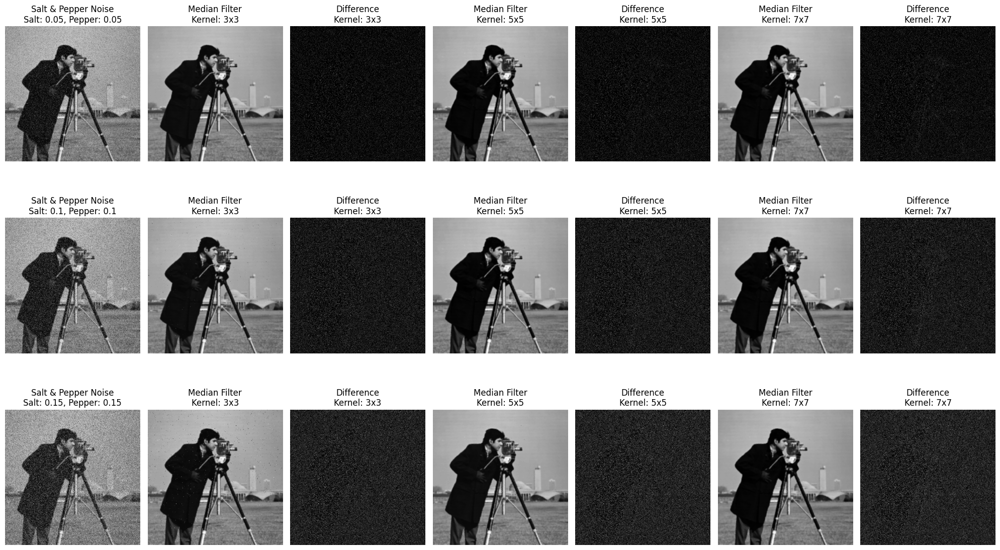

In [52]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the grayscale image
image = cv2.imread('Cameraman_GRAY.png', cv2.IMREAD_GRAYSCALE)

# Function to add salt and pepper noise
def add_salt_and_pepper_noise(image, salt_prob, pepper_prob):
    noisy_image = np.copy(image)
    # Salt noise
    num_salt = np.ceil(salt_prob * image.size)
    coords = [np.random.randint(0, i - 1, int(num_salt)) for i in image.shape]
    noisy_image[coords[0], coords[1]] = 255  # Add salt

    # Pepper noise
    num_pepper = np.ceil(pepper_prob * image.size)
    coords = [np.random.randint(0, i - 1, int(num_pepper)) for i in image.shape]
    noisy_image[coords[0], coords[1]] = 0  # Add pepper

    return noisy_image

# Function to apply median filter
def apply_median_filter(image, kernel_size):
    return cv2.medianBlur(image, kernel_size)

# Noise levels (salt and pepper probabilities)
noise_levels = [(0.05, 0.05), (0.1, 0.1), (0.15, 0.15)]  # (salt probability, pepper probability)

# Median filter sizes
median_filter_sizes = [3, 5, 7]

# Create a figure for visualization
fig, axs = plt.subplots(len(noise_levels), len(median_filter_sizes) * 2 + 1, figsize=(20, 12))

# Loop over noise levels
for i, (salt_prob, pepper_prob) in enumerate(noise_levels):
    # Add salt and pepper noise to the image
    noisy_image = add_salt_and_pepper_noise(image, salt_prob, pepper_prob)

    # Display the noisy image in the first column of the row
    axs[i, 0].imshow(noisy_image, cmap='gray')
    axs[i, 0].set_title(f'Salt & Pepper Noise\nSalt: {salt_prob}, Pepper: {pepper_prob}')
    axs[i, 0].axis('off')

    # Apply different median filters to the noisy image
    for j, kernel_size in enumerate(median_filter_sizes):
        filtered_image = apply_median_filter(noisy_image, kernel_size)
        difference_image = cv2.absdiff(noisy_image, filtered_image)

        # Display the filtered image
        axs[i, 2 * j + 1].imshow(filtered_image, cmap='gray')
        axs[i, 2 * j + 1].set_title(f'Median Filter\nKernel: {kernel_size}x{kernel_size}')
        axs[i, 2 * j + 1].axis('off')

        # Display the difference between the noisy and filtered image
        axs[i, 2 * j + 2].imshow(difference_image, cmap='gray')
        axs[i, 2 * j + 2].set_title(f'Difference\nKernel: {kernel_size}x{kernel_size}')
        axs[i, 2 * j + 2].axis('off')

# Display the figure
plt.tight_layout()
plt.show()


# Sharpening filters

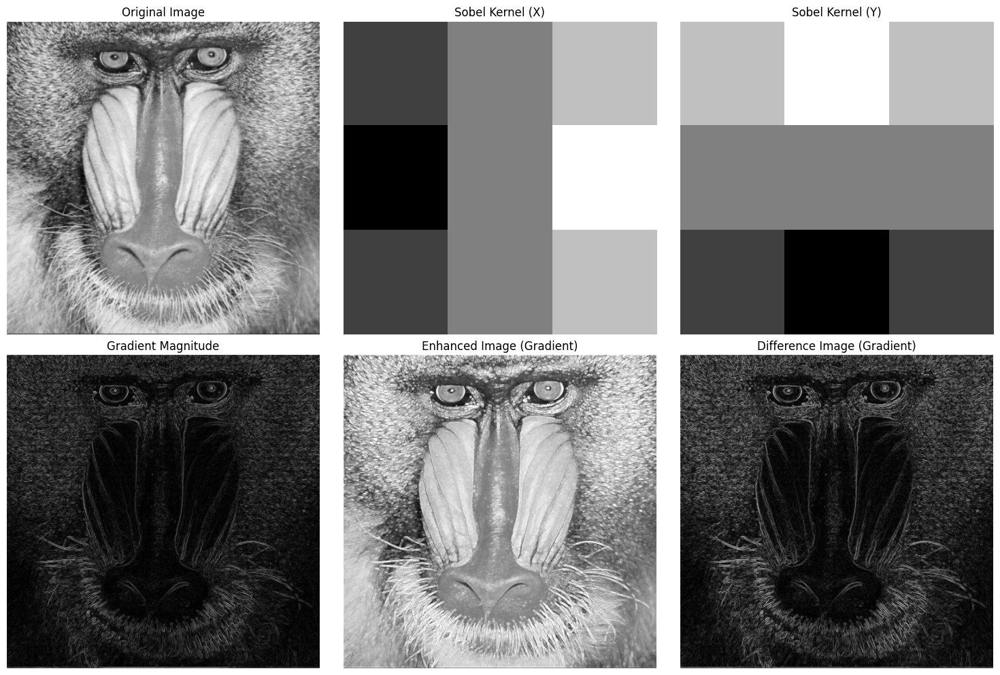

In [53]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the grayscale image
image = cv2.imread('Baboon_GRAY.png', cv2.IMREAD_GRAYSCALE)

# Check if the image was loaded correctly
if image is None:
    print("Error: Image not loaded. Please check the filename and path.")
else:
    # Define Sobel kernels for gradient computation
    sobel_x = np.array([[-1, 0, 1],
                        [-2, 0, 2],
                        [-1, 0, 1]], dtype=np.float32)  # Sobel kernel for x direction

    sobel_y = np.array([[1, 2, 1],
                        [0, 0, 0],
                        [-1, -2, -1]], dtype=np.float32)  # Sobel kernel for y direction

    # Apply Sobel filters to compute gradients
    grad_x = cv2.filter2D(image, cv2.CV_32F, sobel_x)  # Gradient in x direction
    grad_y = cv2.filter2D(image, cv2.CV_32F, sobel_y)  # Gradient in y direction

    # Calculate the gradient magnitude
    gradient_magnitude = cv2.magnitude(grad_x, grad_y)

    # Normalize the gradient magnitude to the range [0, 255]
    gradient_magnitude = cv2.normalize(gradient_magnitude, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

    # Enhance edges by adding the gradient magnitude to the original image
    enhanced_image_gradient = cv2.add(image, gradient_magnitude)

    # Plot the results
    fig, axs = plt.subplots(2, 3, figsize=(15, 10))

    # Display original image
    axs[0, 0].imshow(image, cmap='gray')
    axs[0, 0].set_title('Original Image')
    axs[0, 0].axis('off')

    # Display Sobel kernel in x direction
    axs[0, 1].imshow(sobel_x, cmap='gray')
    axs[0, 1].set_title('Sobel Kernel (X)')
    axs[0, 1].axis('off')

    # Display Sobel kernel in y direction
    axs[0, 2].imshow(sobel_y, cmap='gray')
    axs[0, 2].set_title('Sobel Kernel (Y)')
    axs[0, 2].axis('off')

    # Display gradient magnitude
    axs[1, 0].imshow(gradient_magnitude, cmap='gray')
    axs[1, 0].set_title('Gradient Magnitude')
    axs[1, 0].axis('off')

    # Display enhanced image
    axs[1, 1].imshow(enhanced_image_gradient, cmap='gray')
    axs[1, 1].set_title('Enhanced Image (Gradient)')
    axs[1, 1].axis('off')

    # Show differences (gradient only)
    difference_image_gradient = cv2.subtract(enhanced_image_gradient, image)
    axs[1, 2].imshow(difference_image_gradient, cmap='gray')
    axs[1, 2].set_title('Difference Image (Gradient)')
    axs[1, 2].axis('off')

    # Hide the empty plots
    for ax in axs.flat:
        if not ax.has_data():
            ax.axis('off')

    plt.tight_layout()
    plt.show()


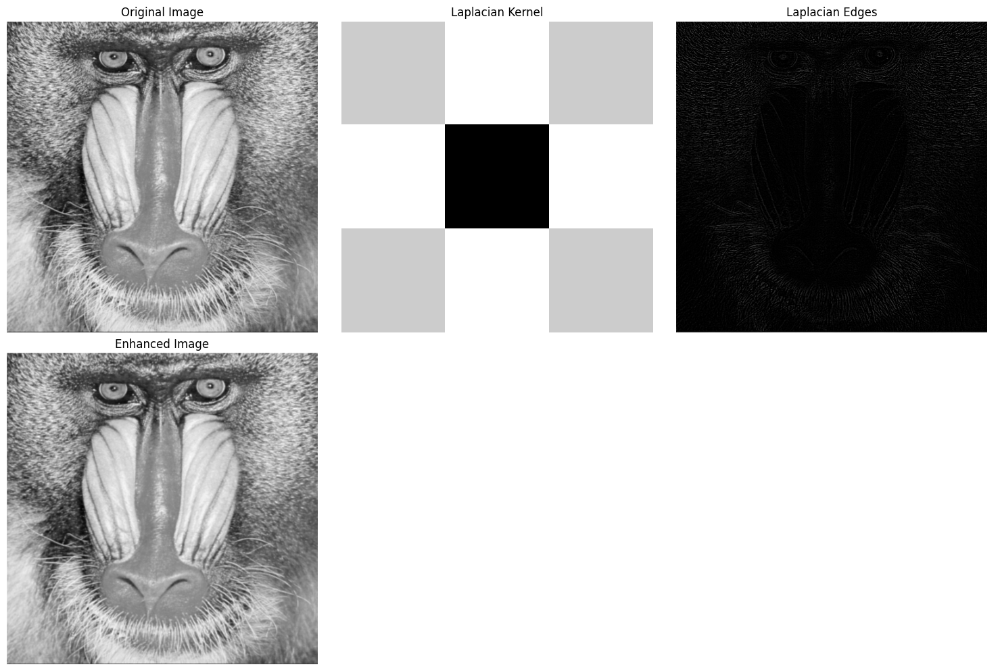

In [54]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the grayscale image
image = cv2.imread('Baboon_GRAY.png', cv2.IMREAD_GRAYSCALE)

# Check if the image was loaded correctly
if image is None:
    print("Error: Image not loaded. Please check the filename and path.")
else:
    # Define the Laplacian kernel
    laplacian_kernel = np.array([[0, 1, 0],
                                 [1, -4, 1],
                                 [0, 1, 0]], dtype=np.float32)  # Laplacian kernel

    # Apply the Laplacian filter to extract edges
    edges = cv2.filter2D(image, -1, laplacian_kernel)

    # Enhance edges by adding the extracted edges to the original image
    enhanced_image = cv2.add(image, edges)

    # Plot the results
    fig, axs = plt.subplots(2, 3, figsize=(15, 10))

    # Display original image
    axs[0, 0].imshow(image, cmap='gray')
    axs[0, 0].set_title('Original Image')
    axs[0, 0].axis('off')

    # Display Laplacian kernel
    axs[0, 1].imshow(laplacian_kernel, cmap='gray')
    axs[0, 1].set_title('Laplacian Kernel')
    axs[0, 1].axis('off')

    # Display edges extracted by Laplacian
    axs[0, 2].imshow(edges, cmap='gray')
    axs[0, 2].set_title('Laplacian Edges')
    axs[0, 2].axis('off')

    # Display enhanced image
    axs[1, 0].imshow(enhanced_image, cmap='gray')
    axs[1, 0].set_title('Enhanced Image')
    axs[1, 0].axis('off')

    # Hide the empty plots
    for ax in axs.flat:
        if not ax.has_data():
            ax.axis('off')

    plt.tight_layout()
    plt.show()


# Sharpening the image with one step filtering

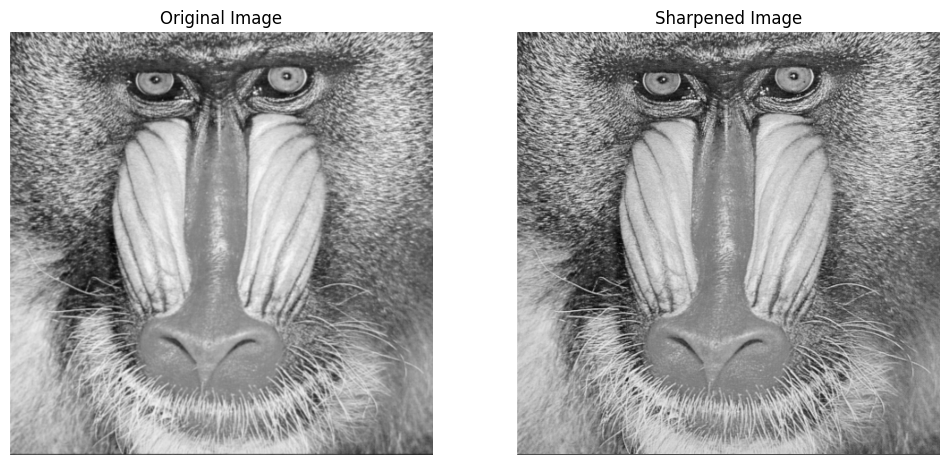

In [55]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the grayscale image
image = cv2.imread('Baboon_GRAY.png', cv2.IMREAD_GRAYSCALE)

# Check if the image was loaded correctly
if image is None:
    print("Error: Image not loaded. Please check the filename and path.")
else:
    # Define the sharpening kernel
    sharpening_kernel = np.array([[0, -1, 0],
                                  [-1, 5, -1],
                                  [0, -1, 0]], dtype=np.float32)

    # Apply the sharpening filter using filter2D
    sharpened_image = cv2.filter2D(image, -1, sharpening_kernel)

    # Plot the original and sharpened images
    plt.figure(figsize=(12, 6))

    # Display original image
    plt.subplot(1, 2, 1)
    plt.imshow(image, cmap='gray')
    plt.title('Original Image')
    plt.axis('off')

    # Display sharpened image
    plt.subplot(1, 2, 2)
    plt.imshow(sharpened_image, cmap='gray')
    plt.title('Sharpened Image')
    plt.axis('off')

    plt.show()


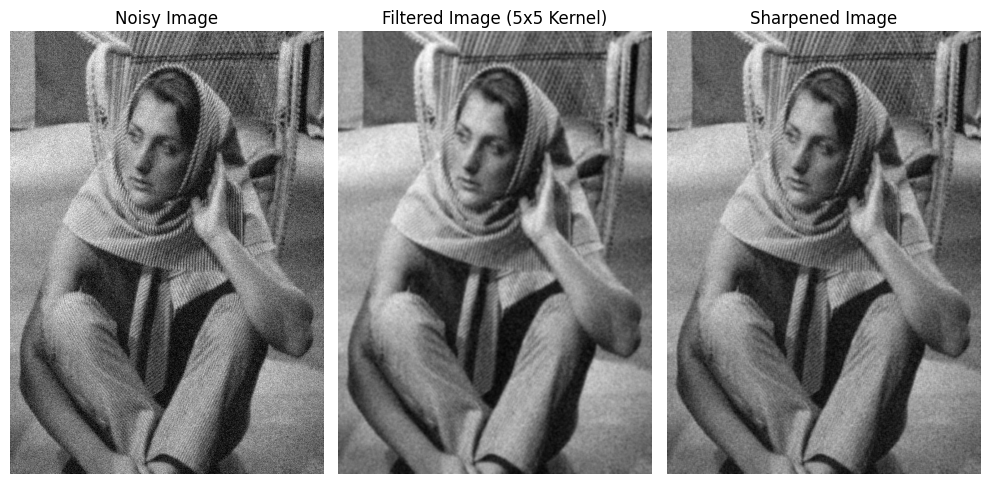

In [56]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the grayscale image
image = cv2.imread('Barbara_GRAY.png', cv2.IMREAD_GRAYSCALE)

# Function to add Gaussian noise
def add_gaussian_noise(image, mean=0, var=1000):
    sigma = var ** 0.5
    gauss = np.random.normal(mean, sigma, image.shape)
    noisy_image = np.clip(image + gauss, 0, 255).astype(np.uint8)
    return noisy_image

# Function to apply averaging filter
def apply_averaging_filter(image, kernel_size):
    return cv2.blur(image, (kernel_size, kernel_size))

# Function to apply sharpening filter
def apply_sharpening_filter(image):
    sharpening_kernel = np.array([[0, -1, 0],
                                  [-1, 5, -1],
                                  [0, -1, 0]], dtype=np.float32)
    return cv2.filter2D(image, -1, sharpening_kernel)

# Add noise to the image (variance 300 for moderate noise)
noisy_image = add_gaussian_noise(image, var=700)

# Apply averaging filter (e.g., 5x5 kernel)
kernel_size = 5
filtered_image = apply_averaging_filter(noisy_image, kernel_size)

# Calculate the difference between the noisy image and filtered image
difference_image = cv2.absdiff(noisy_image, filtered_image)

# Sharpen the filtered image
sharpened_image = apply_sharpening_filter(filtered_image)

# Plot the results
fig, axs = plt.subplots(1, 3, figsize=(10, 5))

# Display noisy image
axs[0].imshow(noisy_image, cmap='gray')
axs[0].set_title('Noisy Image')
axs[0].axis('off')

# Display filtered image
axs[1].imshow(filtered_image, cmap='gray')
axs[1].set_title(f'Filtered Image ({kernel_size}x{kernel_size} Kernel)')
axs[1].axis('off')

# Display the sharpened image
axs[2].imshow(sharpened_image, cmap='gray')
axs[2].set_title('Sharpened Image')
axs[2].axis('off')

plt.tight_layout()
plt.show()
